In [1]:

using Logging
Logging.disable_logging(Logging.Error)
using BeautyContest
using StellarTracks, BolometricCorrections, InitialMassFunctions
using TypedTables: Table,FlexTable
using Unitful,UnitfulAstro,UnitfulAngles
using Korg
using LinearInterpolations
using AstroFITS, OIFITS
using Parameters
using AxisArrays
using Serialization
using Measurements
using LinearAlgebra
using CSV
using Dates


In [2]:
using Plots
gr();

In [3]:
# declare instrument
inst = Instrument()


Instrument
  R: Int64 500
  fov: Quantity{Float64, NoDims, Unitful.FreeUnits{(mas,), NoDims, nothing}}
  fiber_fwhm: Quantity{Float64, NoDims, Unitful.FreeUnits{(mas,), NoDims, nothing}}
  Atel: Quantity{Float64, 𝐋², Unitful.FreeUnits{(m²,), 𝐋², nothing}}
  Ttel: Float64 0.28
  Tfiber: Float64 0.8
  Tgrism: Array{Float64}((233,)) [0.20004895961474578, 0.2577205319745585, 0.31481380343145543, 0.36596061407963315, 0.40765523600628306, 0.4376440977442779, 0.4568721064891666, 0.46739418030194985, 0.47428643690845695, 0.48041534168375055  …  0.1276221955538788, 0.1264837922245892, 0.12482339619257675, 0.12314611960585474, 0.12148344024889524, 0.11965095453833582, 0.11763323078870254, 0.11569799927445606, 0.11372833157211959, 0.11137538059706623]
  Δλ: Quantity{Float64, 𝐋, Unitful.FreeUnits{(nm,), 𝐋, nothing}}
  SR: Float64 0.67
  DIT: Quantity{Int64, 𝐓, Unitful.FreeUnits{(s,), 𝐓, nothing}}
  NDIT: Int64 4
  QE: Float64 0.81
  bkg_param: Array{Float64}((233, 4)) [1.970000147819519 37.2670654

# Globular Cluster Simulation

In [4]:
@with_kw struct Object
	distance= 5_000 # distance in parsec
	Age = 11e9 # Age in year
	mh = -0.75 # metalicity 
	
	
	Av = 3.1*0.04 # reddening
	μ = 5*log10(distance) - 5 # distance modulus 
	
	N = 15 # number of stars
end

obj = Object()
@unpack_Object obj;


## Computing isochrones

In [ ]:
tracklib = PARSECLibrary()
grid= YBCGrid("ubvrijhk")
#grid = MISTBCGrid("MIST_UKIDSS") # Bolometric Corrections
iso = isochrone(tracklib, grid, log10(Age), mh, Av)

Table with 14 columns and 1320 rows:
      eep  m_ini     logTe    Mbol     logg     C_O  U        B        ⋯
    ┌───────────────────────────────────────────────────────────────────
 1  │ 379  0.105416  3.4664   12.2183  5.25099  0.0  19.4185  17.3227  ⋯
 2  │ 380  0.109009  3.47176  12.1047  5.24076  0.0  19.0756  17.044   ⋯
 3  │ 381  0.112749  3.47726  11.9868  5.22996  0.0  18.7262  16.7598  ⋯
 4  │ 382  0.131742  3.50204  11.4348  5.17775  0.0  17.2301  15.5324  ⋯
 5  │ 383  0.145365  3.51227  11.1655  5.15267  0.0  16.6247  15.021   ⋯
 6  │ 384  0.209773  3.5402   10.2439  5.05511  0.0  14.9541  13.5473  ⋯
 7  │ 385  0.266854  3.55243  9.70444  4.99198  0.0  14.1493  12.8061  ⋯
 8  │ 386  0.33663   3.56409  9.19249  4.93361  0.0  13.4144  12.121   ⋯
 9  │ 387  0.463893  3.59936  8.13733  4.79499  0.0  11.7921  10.6216  ⋯
 10 │ 388  0.60621   3.68543  6.66983  4.66824  0.0  8.77806  8.11277  ⋯
 11 │ 389  0.63329   3.70304  6.40132  4.65025  0.0  8.17927  7.68742  ⋯
 12 │ 390  0.6

## Drawing $N$ stars from a realistic initial mass function

In [6]:
IMF = Kroupa2001(minimum(iso.m_ini),maximum(iso.m_ini))
stars_mass = sort!(rand(IMF,N))

15-element Vector{Float64}:
 0.10657041572692452
 0.11975144367933016
 0.1206105057226608
 0.13279829681551522
 0.17023571550294667
 0.17480315551918582
 0.19924012121432677
 0.27779102196185845
 0.3468982319602441
 0.38907793717898853
 0.45036879945462294
 0.4949925794450199
 0.5141196410981962
 0.6095296366905528
 0.7930705809267553

## Determining K magnitude, Te and log(g) for each stars

In [34]:

logTe_interp = Interpolate(iso.m_ini, iso.logTe);
logg_interp = Interpolate(iso.m_ini, iso.logg);
#K_interp = Interpolate(iso.m_ini, iso.K .+ μ);
K_interp = Interpolate(iso.m_ini, iso.K .+ μ);

stars_table = FlexTable(mass = stars_mass, Kmag = K_interp.(stars_mass), logTe = logTe_interp.(stars_mass), logg = logg_interp.(stars_mass) )

FlexTable with 4 columns and 15 rows:
      mass      Kmag     logTe    logg
    ┌────────────────────────────────────
 1  │ 0.10657   22.9521  3.46812  5.2477
 2  │ 0.119751  22.59    3.4864   5.21071
 3  │ 0.120611  22.5676  3.48752  5.20835
 4  │ 0.132798  22.2585  3.50283  5.17581
 5  │ 0.170236  21.7085  3.52305  5.11499
 6  │ 0.174803  21.6485  3.52503  5.10808
 7  │ 0.19924   21.3276  3.53563  5.07106
 8  │ 0.277791  20.607   3.55426  4.98283
 9  │ 0.346898  20.1251  3.56694  4.92243
 10 │ 0.389078  19.8098  3.57863  4.87648
 11 │ 0.450369  19.3517  3.59561  4.80972
 12 │ 0.494993  19.0235  3.61817  4.76729
 13 │ 0.51412   18.8838  3.62974  4.75026
 14 │ 0.60953   18.1936  3.68759  4.66604
 15 │ 0.793071  16.9294  3.78295  4.38214

## Compute spectra of each star

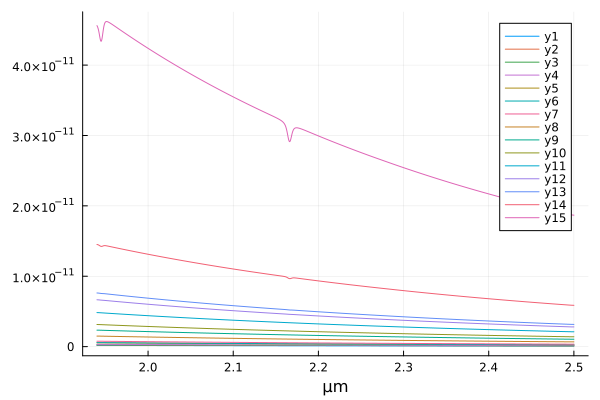

In [35]:
flux = Vector{Vector{Float64}}(undef,N)
cntm = Vector{Vector{Float64}}(undef,N)
λs = []
for (i, (mass, Kmag, logTe, logg)) ∈ enumerate(stars_table)
	λs, flux[i], cntm[i] = synth(; M_H=mh, Teff=10^(logTe), logg= logg,wavelengths=(19400, 25000,1), rectify=false, R=inst.R)	
	flux[i] = flux[i] ./ sum(flux[i]) .* 10^(-Kmag / 2.5) 
end
λs= upreferred.(λs .* 0.1u"nm");
plot(λs.|>u"μm" ,flux,ticks=:native)

## Compute total magnitude

In [36]:

Kmag = -2.5*log10(sum(10 .^(-stars_table.Kmag ./ 2.5) ))

16.203175676837276

## Placing randomly $N$ stars within the field of view

In [37]:

BeautyContest.@unpack_Instrument inst
star_position = [ (rand(2).*fov .- fov/2)  for _ ∈ 1:N]
# recenter
stars_table.star_position = [x .- mean(star_position .* stars_table.Kmag ./ sum(stars_table.Kmag)) for x ∈ star_position]


15-element Vector{Vector{Quantity{Float64, NoDims, Unitful.FreeUnits{(mas,), NoDims, nothing}}}}:
 [-1.0693429409600093 mas, -2.512094102390285 mas]
 [36.409811172566535 mas, 31.397944175839037 mas]
 [28.656088546774566 mas, 40.95048972537598 mas]
 [18.135802125668544 mas, 16.942154856115884 mas]
 [-22.876107380340986 mas, 40.182127134678744 mas]
 [-11.603183719857181 mas, 30.525378516648054 mas]
 [-9.810813928735126 mas, 5.39938300621639 mas]
 [-40.16832070006463 mas, -28.55378763756955 mas]
 [-8.629376813148095 mas, -2.201609884041928 mas]
 [-7.933833095588344 mas, -27.79062391526763 mas]
 [43.204852971895406 mas, -5.297705949310312 mas]
 [-34.95962841035947 mas, -2.7443804830255223 mas]
 [-22.92583228342065 mas, -40.53758466648445 mas]
 [-8.056179925063173 mas, 37.61685333315268 mas]
 [-11.007241890731574 mas, -12.10773446922453 mas]

##  attenuation due to the fiber lobe

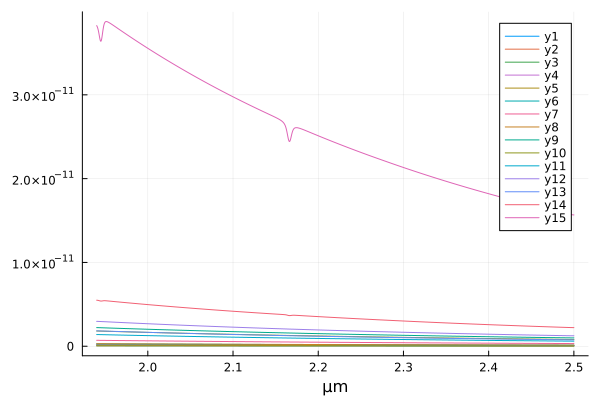

In [38]:
attenuation = [ GaussianFunction(fiber_fwhm,sqrt(sum(abs2,pos))) for pos ∈ stars_table.star_position]

plot(λs.|>u"μm" ,attenuation.*flux, ticks=:native)

# Building the interferometric model

In [39]:

stars = ntuple(i->Punct(stars_table[i].star_position, Interpolate(λs ,attenuation[i] .* flux[i])) , N);

# Computing the interferometric measurements

## Use ASPRO2 to determine (u,v)

In [49]:

filename = "data/Aspro2_47_Tuc_VLTI_GRAVITY_1.97-2.48-233ch_UT1-UT2-UT3-UT4_2026-09-22.fits"
oi = OIDataSet(filename);

## Compute complex vis

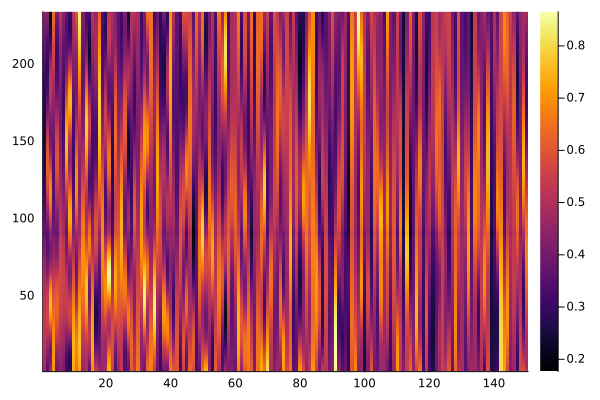

In [51]:
tλ =  oi.vis2[1].eff_wave .* 1u"m"
Δλ = abs((-)(extrema(tλ)...)) / length(tλ) 
ucoord = oi.vis2[1].ucoord .* 1u"m"
vcoord = oi.vis2[1].vcoord .* 1u"m"

vis = make_vis(stars,ucoord,vcoord,tλ)
heatmap(abs2.(vis))

## Plot V2 in the (u,v) plane

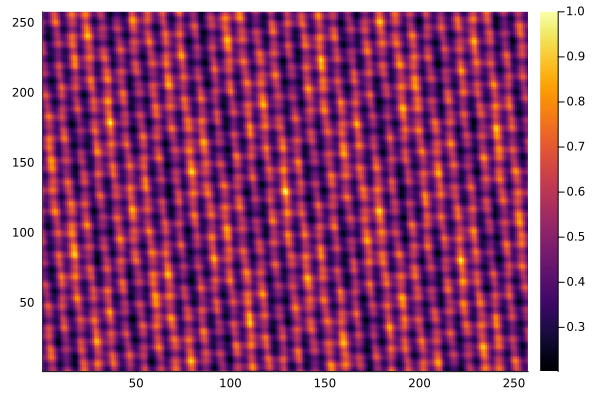

In [52]:
newvis2 = [ abs2.(get_vis(stars, u, v, tλ[1])) for u ∈ (-128:128)*1u"m" , v ∈ (-128:128)*1u"m" ]
heatmap(newvis2)

##  Comparing  Fourier transform of Complex Vis with the simulated image

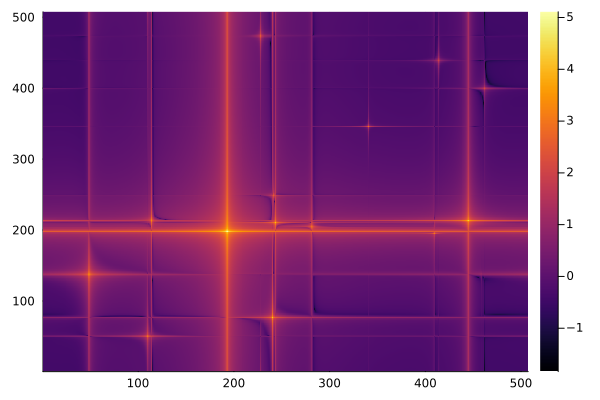

In [53]:
using FFTW
stp = upreferred(fov\oi.vis2[1].eff_wave[1].*1u"m")
imfov = 8*maximum(sqrt.(oi.vis2[1].ucoord.^2 .+ oi.vis2[1].vcoord.^2))*1u"m"
newvis = visgen(stars,  tλ[1], -imfov:stp:imfov)
heatmap(log10.(fftshift(abs.((fft(newvis))))))

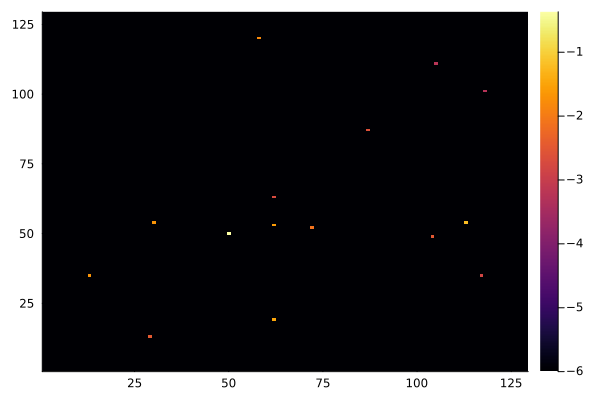

In [54]:
Npx =128
img = AxisArray(-6 .* ones(Float64,Npx+1,Npx+1), -fov/2:(fov)/Npx:fov/2 , -fov/2:(fov)/Npx: fov/2)
sf = mapreduce(f->f[1],+,flux)
foreach(i->img[atvalue.(star_position[i]; atol = fov/Npx)...] .= log10(attenuation[i] .* flux[i][1]./sf), 1:N)
heatmap(img)

## Average flux

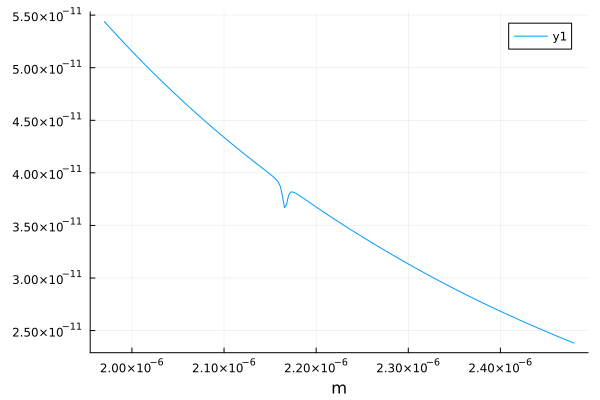

In [55]:
avgflux = map(λ -> get_flux(stars, λ), tλ);
plot(tλ,avgflux, ticks=:native)


## photon flux from the sky

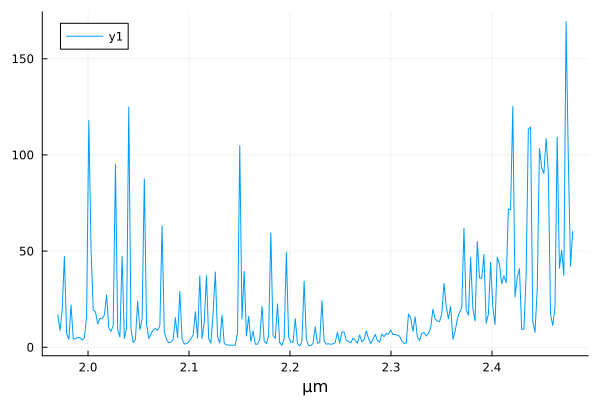

In [56]:
Ksky = 14.90u"arcsecond^-2"

skytablefile = "data/skytable.fits"
sky = readfits(skytablefile,ext=2)

Ssky = sky["FLUX"] .* 1u"s^-1/m^2/μm/arcsecond^2"
Tsky = sky["TRANS"]
Fsky = fluxtophoton(upreferred.(Ssky *  (π * (fiber_fwhm/2)^2)), inst,1) #  Tsky ?
plot(tλ.|>u"μm",Fsky, ticks=:native)

## Flux from the object for a single telescope

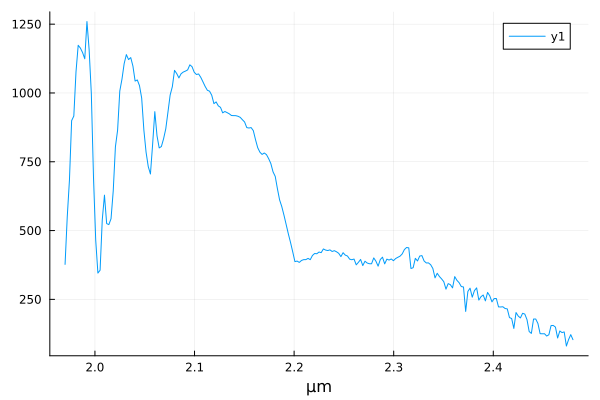

In [57]:
phflux = get_photonflux(Kmag, avgflux)
Fsc = fluxtophoton(SR* phflux, inst,Tsky)
plot(tλ.|>u"μm" , upreferred.(Fsc), ticks=:native)

In [58]:
Fbkg =  Fsky; ## background flux ( no laser here)

## Average number of photon per GRAVITY channel (in COMBINED)


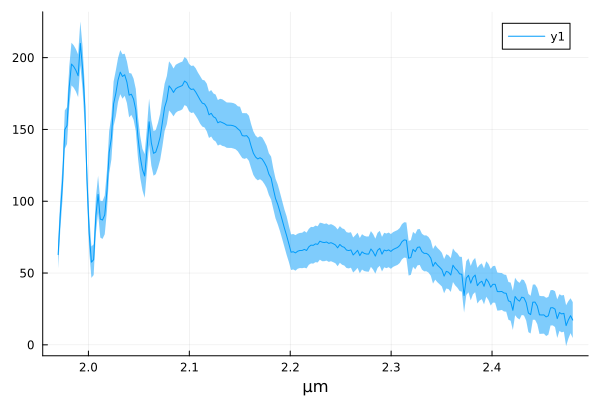

In [60]:
Fch = 2/12 .* Fsc
Varch = 2/12 .* (Fsc .+ 2 .* Fbkg) .+  2 .*  σch.^2 # (Fsc + Fbkg) - Fbkg per channel  
plot(tλ.|>u"μm" , Fch .± sqrt.(Varch); uncertainty_plot = :ribbon, ticks=:native)

## Calibrated flux estimation

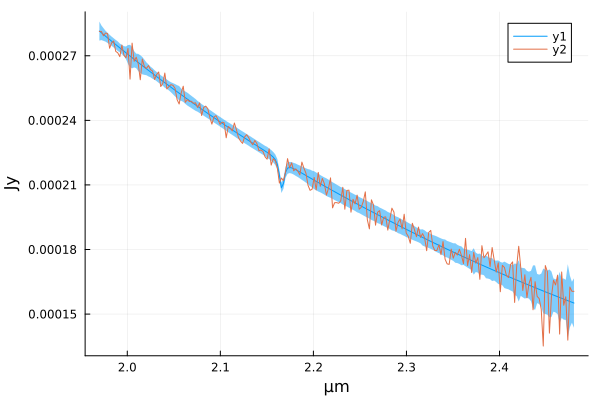

In [61]:
Vflux = 1/(4 * NDIT) * ((Fsc .+ 2 .* Fbkg) .+  6 .* 2 .* σch.^2 )
Fflux = Fsc .± sqrt.(Vflux)
calibratedflux = photontoJansky(Fflux ./ SR, inst, tλ, Tsky)
plot(tλ.|>u"μm", calibratedflux,uncertainty_plot = :ribbon, ticks=:native)
calibratedflux_data = Measurements.value.(calibratedflux) .+ Measurements.uncertainty.(calibratedflux) .* randn(size(calibratedflux)) 
plot!(tλ.|>u"μm", calibratedflux_data , uncertainty_plot = :ribbon, ticks=:native )


In [62]:
Krange = 13:190 # for 390nm in MED resolution
mean(calibratedflux[Krange])

0.00021691 ± 2.5e-7 Jy

## Correlated flux estimation

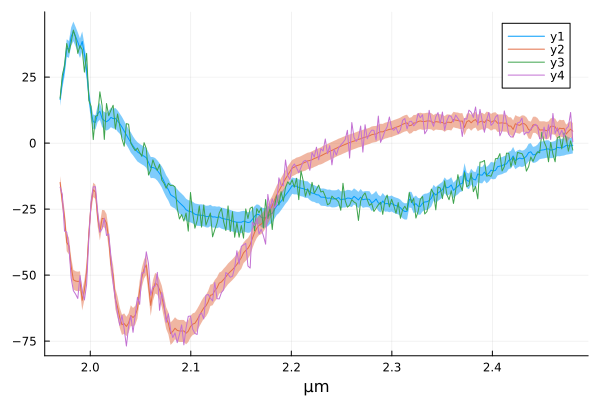

In [63]:
m1 = reshape(oi.vis[1].sta_index,2,6,25)[1,:,1]
m2 = reshape(oi.vis[1].sta_index,2,6,25)[2,:,1]
M = zeros(Int,6,4)
[ M[i,j] = 1 for (i,j) ∈ zip(1:6,m1)]
[ M[i,j] = -1 for (i,j) ∈ zip(1:6,m2)]

# Add random phase piston to visibilities
vispiston = vis .* reshape(cis.( M*randn(4,25)),1,:)

rvis = real.(vispiston) .* Fch ./ 2
rvisvar =   Varch ./ 4 ./ NDIT .* ones( size(rvis) )
 
ivis = imag.(vispiston) .*  Fch ./ 2
ivisvar =  Varch ./ 4 ./ NDIT .* ones( size(ivis) )

plot(tλ.|>u"μm",(rvis .± sqrt.(rvisvar))[:,20],uncertainty_plot = :ribbon, ticks=:native)
plot!(tλ.|>u"μm",(ivis .± sqrt.(ivisvar))[:,20], uncertainty_plot = :ribbon, ticks=:native)

# provide a realisation 

rvisn = (rvis .+ sqrt.(rvisvar) .*randn(size(rvis))) #.± sqrt.(rvisvar)
ivisn = (ivis .+ sqrt.(ivisvar) .*randn(size(ivis))) #.± sqrt.(ivisvar)

plot!(tλ.|>u"μm", rvisn[:,20], ticks=:native)
plot!(tλ.|>u"μm", ivisn[:,20], ticks=:native)

## Squared visibilities estimation

###  V2 and its standard deviation estimation using Monte-Carlo

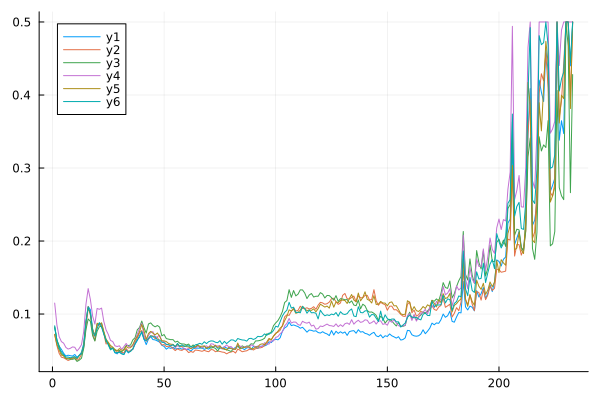

In [64]:
v2, v2err = make_V2(stars, ucoord, vcoord, tλ; Varch=Varch ./ NDIT,flux=Fch)
v2err = min.(v2err,0.5) #
plot(v2err[:,1:6])


### Compute V2 correlation matrix from Kammerer 2020

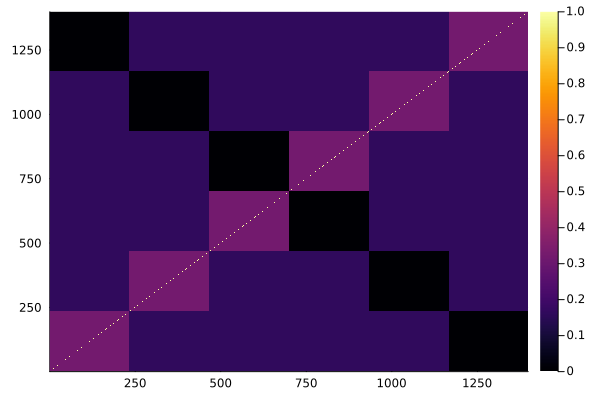

In [65]:
x = 0.32
Bsln = oi.vis2[1].sta_index[:,1:6]
V2corr = makeV2corr_Kammerer2020(Bsln, length(tλ), x)

heatmap(collect(V2corr))

### Compute a realization

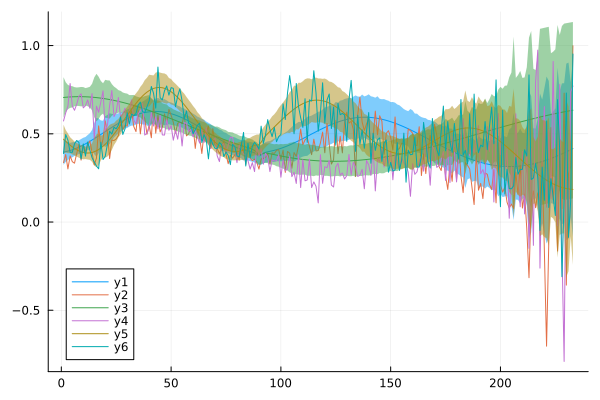

In [66]:
v2n = v2 .+ reshape(reshape(v2err,233*6,:) .* (sqrt(LinearAlgebra.Symmetric(V2corr)) *  randn(size(V2corr,1))),233,:);

plot((v2 .± v2err)[:,5], uncertainty_plot = :ribbon, ticks=:native)
plot!(v2n[:,5])


plot!((v2 .± v2err)[:,4], uncertainty_plot = :ribbon, ticks=:native)
plot!(v2n[:,4])


plot!((v2 .± v2err)[:,3], uncertainty_plot = :ribbon, ticks=:native)
plot!(v2n[:,3])


## Closure phase estimation

###  Closure phase with  standard deviation estimation using Monte-Carlo

In [67]:

t3λ =  oi.t3[1].eff_wave .* 1u"m"

Δ3λ = abs((-)(extrema(t3λ)...)) / length(t3λ) 

u1coord = oi.t3[1].u1coord .* 1u"m"
v1coord = oi.t3[1].v1coord .* 1u"m"
u2coord = oi.t3[1].u2coord .* 1u"m"
v2coord = oi.t3[1].v2coord .* 1u"m"

t3phi, t3phierr = make_t3phi(stars, u1coord, v1coord, u2coord, v2coord, t3λ; Varch =Varch ./ NDIT, flux=(Fch));

### Compute T3 correlation matrix from Kammerer 2020

In [68]:
y = 7.4e-2
Trplt = oi.t3[1].sta_index[:,1:4]

T3corr = makeT3corr_Kammerer2020(Trplt,length(tλ), y);

### Compute a realization

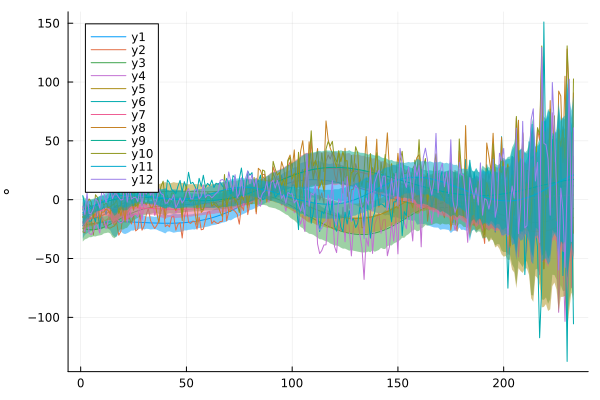

In [69]:
t3phin =  t3phi .+ reshape(reshape(t3phierr,233*4,25) .* (sqrt(LinearAlgebra.Symmetric(T3corr)) *  randn(size(T3corr,1))),233,:);

t3phin = rem.(t3phin, 360u"deg", RoundNearest) 

plot((t3phi.± t3phierr)[:,1], uncertainty_plot = :ribbon, ticks=:native)
plot!((t3phin)[:,1])
plot!((t3phi.± t3phierr)[:,2], uncertainty_plot = :ribbon, ticks=:native)
plot!((t3phin)[:,2])
plot!((t3phi.± t3phierr)[:,3], uncertainty_plot = :ribbon, ticks=:native)
plot!((t3phin)[:,3])
plot!((t3phi.± t3phierr)[:,4], uncertainty_plot = :ribbon, ticks=:native)
plot!((t3phin)[:,4])
plot!((t3phi.± t3phierr)[:,5], uncertainty_plot = :ribbon, ticks=:native)
plot!((t3phin)[:,5])
plot!((t3phi.± t3phierr)[:,6], uncertainty_plot = :ribbon, ticks=:native)
plot!((t3phin)[:,6])

In [33]:
newoifits = "/Users/ferreol/Code/Julia/BeautyContest/Constest.fits"
write(newoifits, oi; overwrite=true)

UndefVarError: UndefVarError: `oi` not defined in `Main`
Suggestion: add an appropriate import or assignment. This global was declared but not assigned.

# Saving data

Save globular cluster stars parameters in a csv

In [ ]:
t = deepcopy( stars_table)
t.x_pos = [ustrip( u"mas",p[1]) for p ∈ stars_table.star_position]
t.y_pos = [ustrip( u"mas",p[2]) for p ∈ stars_table.star_position]
t.star_position = nothing
date_of_creation = now()
gcname = "output/GlobularClusterSimulation_$(date_of_creation)"


"output/GlobularClusterSimulation_2026-02-13T12:24:25.499"

In [134]:
CSV.write(gcname*".csv", t, delim=",\t")

"output/GlobularClusterSimulation_2026-02-13T12:24:25.499.csv"

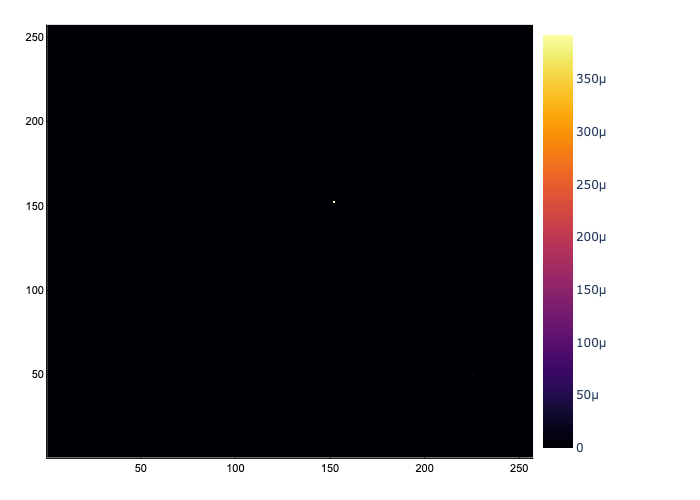

In [135]:
spnrm = ustrip.(u"Jy",Measurements.value.(calibratedflux) ./ avgflux)
Npx =256
img = AxisArray( zeros(Float64,Npx+1,Npx+1, 233), -fov/2:(fov)/Npx:fov/2 , -fov/2:(fov)/Npx: fov/2,1:233)
foreach(i->img[atvalue.(star_position[i]; atol = fov/Npx)...,:] .= map(λ -> get_flux(stars[i], λ), tλ) .* spnrm, 1:N)
heatmap(mean(img; dims=3)[:,:,1])

In [ ]:
fitsname = gcname*".fits"

writefits(fitsname,
          #-----------------------------------------------------------------
          # First HDU must be a FITS "image", but data may be empty.
          #
          # Header part as a vector of `key=>val` or `key=>(val,com)` pairs:
          ["DATE"    => (date_of_creation, "date of creation"),
           "HISTORY" => "Globular cluster simulation file for IIC 2026"
		   ],
          # Data part as an array:
          img,
          #-----------------------------------------------------------------
          # Second HDU, here a FITS "table".
          #
          # Header part of 2nd HDU as a tuple of pairs:
          ("EXTNAME" => ("Stars", "stars parameters"),
           "EXTVER"  => (1, "Version of this extension")),
          # Data part is a table in the form of a named tuple:
          (mass    = (stars_table.mass', "solar mass"),  # this column has units
           Kmag  = (stars_table.Kmag', "K Mag" )    ,        # not this one
           logTe = stars_table.logTe', 
           logg = stars_table.logg',
           position = (hcat(t.x_pos ,t.x_pos), "mas"),
           flux = (mapreduce( i-> (map(λ -> get_flux(stars[i], λ), tλ) .* spnrm), hcat, 1:N), "Jy")
           ),
           overwrite = false
)

In [137]:
#readfits(fitsname, ext=2)["FLUX"]

## OIFITS 

In [ ]:
target = OITargetEntry(
    1, 						# target_id ::Integer,
    "OBJECT 2",     		# target    ::AbstractString,
    6.0 ,					# raep0     ::AbstractFloat,
    72.0 ,					# decep0    ::AbstractFloat,
    2000. ,					# equinox   ::AbstractFloat,
    oi.target[1].ra_err ,   # ra_err   ::AbstractFloat,
    oi.target[1].dec_err,   # dec_err  ::AbstractFloat,
    oi.target[1].sysvel ,   # sysvel   ::AbstractFloat,
    oi.target[1].veltyp  ,  # veltyp   ::AbstractString,
    oi.target[1].veldef  ,  # veldef   ::AbstractString,
    oi.target[1].pmra    ,  # pmra     ::AbstractFloat,
    oi.target[1].pmdec    , # pmdec    ::AbstractFloat,
    oi.target[1].pmra_err , # pmra_err ::AbstractFloat,
    oi.target[1].pmdec_err, # pmdec_err::AbstractFloat,
    oi.target[1].parallax , # parallax ::AbstractFloat,
    oi.target[1].para_err , # para_err ::AbstractFloat,
    oi.target[1].spectyp   ,# spectyp  ::AbstractString,
    "SCI"  ,# category ::AbstractString = ""
)

array = oi.array[1]
sta_number = length(array.sta_index)
array.fov  = ones(sta_number) .*  ustrip(u"arcsecond",fiber_fwhm)
array.fov[5:end] .= 1.8 .* 8 .*  ustrip(u"arcsecond",fiber_fwhm)
fovtype = Vector{String}(undef,sta_number)
fill!(fovtype, "FWHM")
array.fovtype	= fovtype
array.revn = 2

instr = oi.instr[1] ;
instr.revn = 2

In [139]:
ds = OIDataSet(OI_TARGET([target]; revn=2), array, instr) ;

In [ ]:
oicorrv2 = OI_CORR(undef)
oicorrv2.revn = 1
oicorrv2.corrname = "V2corr"

V2IINDX, V2JINDX, V2CORR 	= sparsify_correlation_matrix(V2corr)
oicorrv2.iindx 				= V2IINDX
oicorrv2.jindx 				= V2JINDX
oicorrv2.corr 				= V2CORR
oicorrv2.ndata 				= size(V2corr,1)
push!(ds,oicorrv2)

OIDataSet(OI_TARGET(2, OITargetEntry[OITargetEntry(1, "Mock Cluster", 6.0, 72.0, 2000.0, 0.0, 0.0, -17200.0, "UNKNOWN", "OPTICAL", 1.4583333333333333e-6, -7.027777777777777e-7, 0.0, 0.0, 6.444444267117433e-8, 2.4999999848063226e-9, " ", "")]), Dict("MOCK CLUSTER" => 1), Dict(1 => 1), OI_ARRAY[OI_ARRAY(1, "VLTI", "GEOCENTRIC", 1.9464099709899623e6, -5.46766010589381e6, -2.6427283998888675e6, ["UT", "UT", "UT", "UT", "AT", "AT", "AT", "AT", "AT", "AT"  …  "AT", "AT", "AT", "AT", "AT", "AT", "AT", "AT", "AT", "AT"], ["UT1", "UT2", "UT3", "UT4", "A0", "A1", "B0", "B1", "B2", "B3"  …  "I2", "J1", "J2", "J3", "J4", "J5", "J6", "K0", "L0", "M0"], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  26, 27, 28, 29, 30, 31, 32, 33, 34, 35], [8.0, 8.0, 8.0, 8.0, 1.7999999523162842, 1.7999999523162842, 1.7999999523162842, 1.7999999523162842, 1.7999999523162842, 1.7999999523162842  …  1.7999999523162842, 1.7999999523162842, 1.7999999523162842, 1.7999999523162842, 1.7999999523162842, 1.7999999523162842, 1.7999999523

In [ ]:
oicorrT3 = OI_CORR(undef)
oicorrT3.revn = 1
oicorrT3.corrname = "T3corr"

T3IINDX, T3JINDX, T3CORR 	= sparsify_correlation_matrix(T3corr)
oicorrT3.iindx 				= T3IINDX
oicorrT3.jindx 				= T3JINDX
oicorrT3.corr 				= T3CORR
oicorrT3.ndata 				= size(T3corr,1)
push!(ds,oicorrT3)

OIDataSet(OI_TARGET(2, OITargetEntry[OITargetEntry(1, "Mock Cluster", 6.0, 72.0, 2000.0, 0.0, 0.0, -17200.0, "UNKNOWN", "OPTICAL", 1.4583333333333333e-6, -7.027777777777777e-7, 0.0, 0.0, 6.444444267117433e-8, 2.4999999848063226e-9, " ", "")]), Dict("MOCK CLUSTER" => 1), Dict(1 => 1), OI_ARRAY[OI_ARRAY(1, "VLTI", "GEOCENTRIC", 1.9464099709899623e6, -5.46766010589381e6, -2.6427283998888675e6, ["UT", "UT", "UT", "UT", "AT", "AT", "AT", "AT", "AT", "AT"  …  "AT", "AT", "AT", "AT", "AT", "AT", "AT", "AT", "AT", "AT"], ["UT1", "UT2", "UT3", "UT4", "A0", "A1", "B0", "B1", "B2", "B3"  …  "I2", "J1", "J2", "J3", "J4", "J5", "J6", "K0", "L0", "M0"], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  26, 27, 28, 29, 30, 31, 32, 33, 34, 35], [8.0, 8.0, 8.0, 8.0, 1.7999999523162842, 1.7999999523162842, 1.7999999523162842, 1.7999999523162842, 1.7999999523162842, 1.7999999523162842  …  1.7999999523162842, 1.7999999523162842, 1.7999999523162842, 1.7999999523162842, 1.7999999523162842, 1.7999999523162842, 1.7999999523

In [142]:
oiflux = OI_FLUX(undef)
oiflux.revn		= 1
oiflux.date_obs = oi.flux[1].date_obs
oiflux.insname 	= oi.flux[1].insname
#oiflux.arrname 	= oi.flux[1].arrname
oiflux.fov 	 	= ustrip(u"arcsecond",fiber_fwhm)
oiflux.fovtype	= "FWHM"
oiflux.calstat 	= "C"

oiflux.target_id= [oi.flux[1].target_id[1]]
oiflux.mjd		= [oi.flux[1].mjd[1]]		
oiflux.int_time	= NDIT .* [oi.flux[1].int_time[1]]
oiflux.flag		= zeros(Int,233,1)	
oiflux.fluxdata = reshape(ustrip.(u"Jy",calibratedflux_data),:,1)
oiflux.fluxerr 	= reshape(ustrip.(u"Jy",Measurements.uncertainty.(calibratedflux)),:,1)
#oiflux.sta_index= oi.flux[1].sta_index
push!(ds,oiflux);

In [ ]:
oivis = OI_VIS(undef)
oivis.revn = 2
oivis.date_obs		= oi.vis[1].date_obs	
oivis.arrname 		= oi.vis[1].arrname
oivis.insname 		= oi.vis[1].insname
oivis.target_id 	= oi.vis[1].target_id
oivis.time 			= oi.vis[1].time
oivis.mjd 			= oi.vis[1].mjd
oivis.int_time 		= NDIT .* oi.vis[1].int_time
oivis.ucoord 		= oi.vis[1].ucoord
oivis.vcoord 		= oi.vis[1].vcoord
oivis.sta_index  	= oi.vis[1].sta_index

oivis.amptyp		= "correlated flux"
oivis.visamp 		= sqrt.(rvisn.^2 .+ ivisn.^2)
oivis.visamperr 	= sqrt.((rvisvar .* rvisn.^2 .+ ivisvar .* ivisn.^2) ./ (rvisn.^2 .+ ivisn.^2))
oivis.visphi 		= NaN .* ones(size(rvisn))
oivis.visphierr		= NaN .* ones(size(rvisn))
oivis.rvis			= rvisn
oivis.rviserr		= sqrt.(rvisvar)
oivis.ivis			= ivisn
oivis.iviserr		= sqrt.(ivisvar)
oivis.flag			= zeros(Int,size(rvisn))	
push!(ds,oivis);


In [144]:
oivis2 = OI_VIS2(undef)
oivis2.revn = 2 
oivis2.date_obs		= oi.vis2[1].date_obs	
oivis2.arrname 		= oi.vis2[1].arrname
oivis2.insname 		= oi.vis2[1].insname

oivis2.corrname 	= oicorrv2.corrname

oivis2.target_id 	= oi.vis2[1].target_id
oivis2.time 		= oi.vis2[1].time
oivis2.mjd 			= oi.vis2[1].mjd
oivis2.int_time 	= NDIT .* oi.vis2[1].int_time
oivis2.ucoord 		= oi.vis2[1].ucoord
oivis2.vcoord 		= oi.vis2[1].vcoord
oivis2.sta_index  	= oi.vis2[1].sta_index

oivis2.vis2data 	= v2n
oivis2.vis2err		= v2err
oivis2.corrindx_vis2data = repeat((0:5).*233 .+1 ,25)
oivis2.flag			= zeros(Int,size(rvisn))
push!(ds,oivis2);


In [145]:
oit3 = OI_T3(undef)
oit3.revn = 2 
oit3.date_obs		= oi.t3[1].date_obs	
oit3.arrname 		= oi.t3[1].arrname
oit3.insname 		= oi.t3[1].insname
oit3.target_id 		= oi.t3[1].target_id
oit3.time 			= oi.t3[1].time
oit3.mjd 			= oi.t3[1].mjd
oit3.int_time 		= NDIT .* oi.t3[1].int_time
oit3.u1coord 		= oi.t3[1].u1coord
oit3.v1coord 		= oi.t3[1].v1coord
oit3.u2coord 		= oi.t3[1].u2coord
oit3.v2coord 		= oi.t3[1].v2coord
oit3.sta_index  	= oi.t3[1].sta_index


oit3.corrname 	= oicorrT3.corrname
oit3.corrindx_t3phi = repeat((0:3).*233 .+1 ,25)	

oit3.t3amp 		= NaN .* ones(size(t3phin))
oit3.t3amperr 	= NaN .* ones(size(t3phin))
oit3.t3phi 		= ustrip.(u"deg",t3phin)
oit3.t3phierr	= ustrip.(u"deg",t3phierr)


oit3.flag			= zeros(Int,size(t3phin))	
push!(ds,oit3);


In [ ]:
newoifits = gcname*".oifits"
write(newoifits, ds; overwrite=false)

In [ ]:
f = openfits(newoifits,"rw")
hdu = f[1]
hdu["CONTENT"] = "OIFITS2"
hdu["DATE"] = oi.vis2[1].date_obs
hdu["DATE-OBS"] = oi.vis2[1].date_obs
hdu["CONTENT"] = "OIFITS2"
hdu["OBJECT"] = target.target
hdu["TELESCOP"] = array.arrname
hdu["INSTRUME"] = instr.insname
hdu["ORIGIN"] = "Interferometric Imaging Contest"
hdu["AUTHOR"] = "J. Drevon & F. Soulez"

hdu = f["OI_FLUX"]
hdu["TUNIT$(hdu.column_number("FLUXDATA"))"]  = "Jy"
hdu["TUNIT$(hdu.column_number("FLUXERR"))"]  = "Jy"


hdu = f["OI_VIS"]
hdu["TUNIT$(hdu.column_number("IVIS"))"]  = "ADU"
hdu["TUNIT$(hdu.column_number("IVISERR"))"]  = "ADU"
hdu["TUNIT$(hdu.column_number("RVIS"))"]  = "ADU"
hdu["TUNIT$(hdu.column_number("RVISERR"))"]  = "ADU"

close(f)

In [150]:
pdfname =gcname*".pdf"
run(`typst compile BeautyContest.typ $(pdfname)`);

     ┌─ @preview/mitex:0.2.5/specs/latex/standard.typ:1045:30
     │
1045 │   KaTeX: of-sym(math.upright($kai A T E X$)),
     │                               ^^^

  ┌─ BeautyContest.typ:3:16
  │
3 │ #set text(font: "STIX Two Text")
  │                 ^^^^^^^^^^^^^^^
  │
  = hint: try installing a static version of "stix two text" instead

